In [8]:
# Common
import os
import cv2 as cv
import numpy as np
from IPython.display import clear_output as cls

# Data 
from tqdm import tqdm
from glob import glob

# Data Visuaalization
import plotly.express as px
import matplotlib.pyplot as plt

# Model
from tensorflow.keras.models import load_model

In [9]:
# Setting a random
np.random(.seed42)

# Define the image dimensions
IMG_W, IMG_H, IMG_C = (160, 160, 3)

In [10]:
# Specify the root directory path
root_path = r"D:\Recogniton\105_classes_pins_dataset"

# Collect all the person names
dir_names = os.listdir(root_path)
person_names = [name.split("_")[-1].title() for name in dir_names]
n_individuals = len(person_names)

print(f"Total number of individuals: {n_individuals}\n")
print(f"Name of the individuals : \n\t{person_names}")

Total number of individuals: 105

Name of the individuals : 
	['Adriana Lima', 'Alex Lawther', 'Alexandra Daddario', 'Alvaro Morte', 'Alycia Dabnem Carey', 'Amanda Crew', 'Amber Heard', 'Andy Samberg', 'Anne Hathaway', 'Anthony Mackie', 'Avril Lavigne', 'Barack Obama', 'Barbara Palvin', 'Ben Affleck', 'Bill Gates', 'Bobby Morley', 'Brenton Thwaites', 'Brian J. Smith', 'Brie Larson', 'Camila Mendes', 'Chris Evans', 'Chris Hemsworth', 'Chris Pratt', 'Christian Bale', 'Cristiano Ronaldo', 'Danielle Panabaker', 'Dominic Purcell', 'Dwayne Johnson', 'Eliza Taylor', 'Elizabeth Lail', 'Elizabeth Olsen', 'Ellen Page', 'Elon Musk', 'Emilia Clarke', 'Emma Stone', 'Emma Watson', 'Gal Gadot', 'Grant Gustin', 'Gwyneth Paltrow', 'Henry Cavil', 'Hugh Jackman', 'Inbar Lavi', 'Irina Shayk', 'Jake Mcdorman', 'Jason Momoa', 'Jeff Bezos', 'Jennifer Lawrence', 'Jeremy Renner', 'Jessica Barden', 'Jimmy Fallon', 'Johnny Depp', 'Josh Radnor', 'Katharine Mcphee', 'Katherine Langford', 'Keanu Reeves', 'Kiernen S

In [14]:
import os

root_path = r"D:\Recogniton\105_classes_pins_dataset"

# List all the directories in the root path
dir_names = os.listdir(root_path)

# Get the number of images in each directory
n_images_per_person = [len(os.listdir(os.path.join(root_path, name))) for name in dir_names]

# Calculate the total number of images
n_images = sum(n_images_per_person)

# Display the result
print(f"Total Number of Images: {n_images}.")


Total Number of Images: 17534.


In [15]:
# Plot the Distribution of number of images per person.
fig = px.bar(x=person_names, y=n_images_per_person, color=person_names)
fig.update_layout({'title':{'text':"Distribution of number of images per person"}})
fig.show()

In [25]:
import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from tqdm import tqdm
from glob import glob

root_path = r"D:\Recogniton\105_classes_pins_dataset"
IMG_W = 224
IMG_H = 224
IMG_C = 3

# List all the directories in the root path
dir_names = os.listdir(root_path)
person_names = sorted(set([name.split('_')[1] for name in dir_names]))
num_classes = len(person_names)

# Select all the file paths: 50 images per person
filepaths = [path for name in dir_names for path in glob(os.path.join(root_path, name, '*'))[:50]]
np.random.shuffle(filepaths)
print(f"Total number of images to be loaded: {len(filepaths)}")

# Create space for the images
all_images = np.empty(shape=(len(filepaths), IMG_W, IMG_H, IMG_C), dtype=np.float32)
all_labels = np.empty(shape=(len(filepaths), 1), dtype=np.int32)

# For each path, load the image and apply some preprocessing.
for index, path in tqdm(enumerate(filepaths), desc="Loading Data"):
    
    # Extract label
    label = [name for name in dir_names if name in path][0]
    label = label.split('_')[1]
    label_index = person_names.index(label)
    
    # Load the Image
    image = plt.imread(path)
    
    # Resize the image
    image = cv.resize(image, dsize=(IMG_W, IMG_H))
    
    # Convert image type
    image = image.astype(np.float32) / 255.0
    
    # Store the image and the label
    all_images[index] = image
    all_labels[index] = label_index


Total number of images to be loaded: 5250


Loading Data: 5250it [00:49, 106.31it/s]


In [26]:
def show_data(
    images: np.ndarray, 
    labels: np.ndarray,
    GRID: tuple=(15,6),
    FIGSIZE: tuple=(25,50), 
    recog_fn = None,
    database = None
) -> None:
    

    
    # Plotting Configuration
    plt.figure(figsize=FIGSIZE)
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    
    # loop over the images and labels
    for index in range(n_images):
        
        # Select image in the corresponding label randomly
        image_index = np.random.randint(len(images))
        image, label = images[image_index], person_names[int(labels[image_index])]
        
        # Create a Subplot
        plt.subplot(n_rows, n_cols, index+1)
        
        # Plot Image
        plt.imshow(image)
        plt.axis('off')
        
        if recog_fn is None:
            # Plot title
            plt.title(label)
        else:
            recognized = recog_fn(image, database)
            plt.title(f"True:{label}\nPred:{recognized}")
    
    # Show final Plot
    plt.tight_layout()
    plt.show()

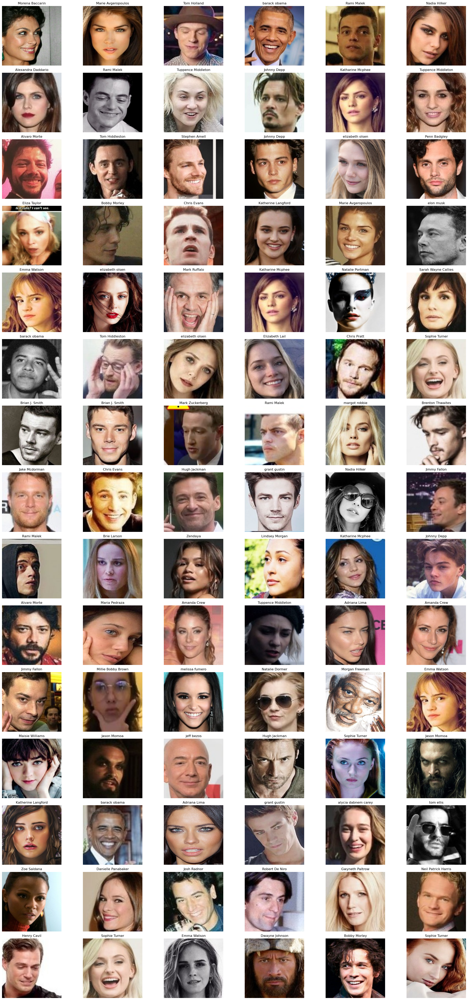

In [27]:
show_data(images = all_images, labels = all_labels)

In [29]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam


In [30]:
face_net_model = tf.keras.applications.MobileNetV2(
    input_shape=(IMG_W, IMG_H, IMG_C),
    include_top=False,
    weights='imagenet'
)


9406464/9406464 [==============================] - 3s 0us/step


In [31]:
for layer in face_net_model.layers:
    layer.trainable = False


In [32]:
x = face_net_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
output = Dense(num_classes, activation='softmax')(x)


In [33]:
model = Model(inputs=face_net_model.input, outputs=output)


In [34]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [35]:
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=Adam(learning_rate=0.001),
    metrics=['accuracy']
)


In [37]:
import matplotlib.pyplot as plt

# Train the model and record the learning rate history
history = model.fit(
    all_images, all_labels,
    batch_size=32,
    epochs=10,
    validation_split=0.2
)

# Extract the learning rates from the training history
learning_rates = history.history['lr']

# Plot the learning rate over epochs
plt.plot(range(len(learning_rates)), learning_rates)
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Schedule')
plt.show()


Epoch 1/10
132/132 [==============================] - 118s 896ms/step - loss: 4.3385 - accuracy: 0.0419 - val_loss: 4.0484 - val_accuracy: 0.0790
Epoch 2/10
132/132 [==============================] - 102s 774ms/step - loss: 3.6582 - accuracy: 0.1390 - val_loss: 3.7314 - val_accuracy: 0.1181
Epoch 3/10
132/132 [==============================] - 105s 800ms/step - loss: 3.1583 - accuracy: 0.2314 - val_loss: 3.5651 - val_accuracy: 0.1476
Epoch 4/10
132/132 [==============================] - 105s 797ms/step - loss: 2.7455 - accuracy: 0.3198 - val_loss: 3.3731 - val_accuracy: 0.1819
Epoch 5/10
132/132 [==============================] - 115s 875ms/step - loss: 2.4284 - accuracy: 0.3912 - val_loss: 3.2451 - val_accuracy: 0.2162
Epoch 6/10
132/132 [==============================] - 131s 997ms/step - loss: 2.1496 - accuracy: 0.4557 - val_loss: 3.2254 - val_accuracy: 0.2200
Epoch 7/10
132/132 [==============================] - 126s 953ms/step - loss: 1.9071 - accuracy: 0.5305 - val_loss: 3.1805 -

KeyError: 'lr'

In [39]:
import tensorflow as tf
from tensorflow.keras.models import load_model


# Save the entire model
model.save('facenet_model.h5')


In [40]:
# Assuming you have already loaded and trained your Facenet model
model = load_model('facenet_model.h5')